<a href="https://colab.research.google.com/github/IlyaZutler/Project-3-Berlin-Airbnb-Ratings/blob/main/EDA_11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Descriptions of dataset

The dataset contains descriptions of 24k apartments for rent.

There are 450k reviews for these apartments. They were not analyzed (the vast majority are positive).

The description of the apartments contains, among other things, the following features:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

!pip install openpyxl -q
import openpyxl

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

from datetime import datetime

# missing data
!pip install missingno -q
import missingno as msno

# for map
!pip install -q folium matplotlib
import folium
from matplotlib.colors import LinearSegmentedColormap, Normalize, to_hex

# for grid
!pip install geopy -q
from geopy.distance import geodesic

!pip install pandas numpy libpysal geopy esda -q
from geopy.distance import great_circle

# for Moran
!pip install pandas numpy libpysal geopy esda -q
import libpysal
from esda.moran import Moran

# linear regression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


# Set display options
%matplotlib inline
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_colwidth', 1000)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 13.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.4/135.4 kB 9.5 MB/s eta 0:00:00


In [34]:
apartments_initial = pd.read_excel('https://raw.githubusercontent.com/IlyaZutler/Project-3-Berlin-Airbnb-Ratings/main/apartments.xlsx', engine='openpyxl')

In [35]:
apartments = apartments_initial.copy()

# Data Protocol

In [ ]:
# Type of valaues
apartments.dtypes.to_excel("Berlin_datatype.xlsx", sheet_name='data_type')
# Maximum valaues
numeric_apartments = apartments.select_dtypes(include=['number'])
numeric_apartments.max().to_excel("max_Berlin.xlsx", sheet_name='max')
# Minimum Values
numeric_apartments.min().to_excel("min_Berlin.xlsx", sheet_name='min')
# Missing Values
apartments.isnull().sum(axis=0).to_excel("NA_Berlin.xlsx", sheet_name='NA')
# exporting results to the protocol
apartments.nunique().to_excel("unique_Berlin.xlsx", sheet_name='unique')

# Descriptive Statistics

In [36]:
apartments.shape, apartments['Listing ID'].nunique()

((23536, 34), 23536)

In [ ]:
apartments.isna().sum()

In [ ]:
apartments.info()

In [ ]:
apartments.describe()

In [5]:
categorical_cols = apartments.select_dtypes(exclude='number').columns
for col in categorical_cols:
  print(f"Value counts for column '{col}' :")
  print(apartments[col].value_counts())
  print(f"NaN values: {apartments[col].isnull().sum()} ")
  print()
  print()

Value counts for column 'Host Since' :
Host Since
08-19-13    59
02-20-17    52
01-17-16    47
02-19-16    39
08-02-16    37
            ..
06-03-11     1
03-28-11     1
10-15-17     1
06-28-11     1
08-25-09     1
Name: count, Length: 3085, dtype: int64
NaN values: 21 


Value counts for column 'Host Response Time' :
Host Response Time
within an hour        6816
within a few hours    2913
within a day          2767
a few days or more     550
Name: count, dtype: int64
NaN values: 10490 


Value counts for column 'Is Superhost' :
Is Superhost
f    19948
t     3567
Name: count, dtype: int64
NaN values: 21 


Value counts for column 'neighbourhood' :
neighbourhood
NeukÃ¶lln                    3444
Prenzlauer Berg              2995
Kreuzberg                    2936
Friedrichshain               2782
Mitte                        2212
Wedding                      1542
SchÃ¶neberg                  1097
Charlottenburg                858
Moabit                        828
Wilmersdorf             

# Autoviz report

In [ ]:
# !pip install autoviz -q
# from autoviz.AutoViz_Class import AutoViz_Class
# %matplotlib inline
# AV = AutoViz_Class()
# AV.AutoViz('', dfte = apartments)

# Data Visualisation

## Missing data

In [ ]:
!pip install missingno -q
import missingno as msno

msno.matrix(apartments)

## Numeric data visualisation

In [37]:
from datetime import datetime

apartments['Host Since'] = pd.to_datetime(apartments['Host Since'])
apartments['First Review'] = pd.to_datetime(apartments['First Review'])
apartments['Last Review'] = pd.to_datetime(apartments['Last Review'])

today = pd.to_datetime(datetime.today().strftime('%Y-%m-%d'))

apartments['Host Since Years'] = (today - apartments['Host Since']).dt.days / 365.25
apartments['Last Review Years'] = (today - apartments['Last Review']).dt.days / 365.25
apartments['First Review Years'] = (today - apartments['First Review']).dt.days / 365.25

In [38]:
apartments['Listing ID'] = apartments['Listing ID'].astype(str)
apartments['Postal Code'] = apartments['Postal Code'].astype(str)

In [ ]:
numeric_cols = apartments.select_dtypes(include='number').columns
apartments[numeric_cols].hist(figsize=(25, 25), bins=35, xlabelsize=12, ylabelsize=12, color = "navy");

## Categorica data visualisation

In [42]:
categorical_cols = apartments.select_dtypes(exclude='number').columns
categorical_cols = categorical_cols.drop(['Listing ID', 'Host Since', 'First Review', 'Last Review'])

In [ ]:
fig, axes = plt.subplots(5, 2, figsize=(15, 20))
axes = axes.flatten()

for i, col in enumerate(categorical_cols):
    sns.countplot(data=apartments, x=col, ax=axes[i])
    axes[i].set_title(f"Distribution of {col}")
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

## Outliers

In [ ]:
plt.figure(figsize=(20,200))

def outliers_boxplot(df):
    for i, col in enumerate(df.columns):
            ax = plt.subplot(60, 3, i+1)
            sns.boxplot(data=df, x=col, ax=ax)
            plt.subplots_adjust(hspace = 0.7)
            plt.title('Box Plot: {}'.format(col), fontsize=15)
            plt.xlabel('{}'.format(col), fontsize=14)

outliers_boxplot(apartments[numeric_cols])

## Selecting data for analysis

In [46]:
# drop noninformtive columns
apartments = apartments.drop(['City', 'Square Feet','Business Travel Ready'], axis=1)

## Filling missing data - Post Code

In [47]:
!pip install geopy -q
from geopy.distance import great_circle

for i in apartments[apartments['Postal Code'].isna()].index:

    lat1 = apartments.loc[i, 'Latitude']
    lon1 = apartments.loc[i, 'Longitude']

    # find closed object whith Postal Code
    min_distance = float('inf')
    nearest_postal_code = None
    for j in apartments[apartments['Postal Code'].notna()].index:
        lat2 = apartments.loc[j, 'Latitude']
        lon2 = apartments.loc[j, 'Longitude']
        distance = great_circle((lat1, lon1), (lat2, lon2)).km
        if distance < min_distance:
            min_distance = distance
            nearest_postal_code = apartments.loc[j, 'Postal Code']

    apartments.loc[i, 'Postal Code1'] = nearest_postal_code

apartments.loc[apartments['Postal Code1'].isna(), 'Postal Code1'] = apartments['Postal Code']
apartments['Postal Code1'] = apartments['Postal Code1'].astype(str)

In [48]:
# save transformrd file
apartments.to_excel('apartments2.xlsx', index=False) # Save as Excel

## Select data for analisis whithout Outliers

In [49]:
apartments = apartments[apartments['Property Type'].isin(['Apartment', 'Condominium'])]
apartments = apartments[(apartments['Price'] > 10) & (apartments['Price'] < 300)]
apartments = apartments[apartments['Min Nights'] <= 14]
apartments = apartments[apartments['Room Type'] != 'Shared room']
apartments.shape

(19699, 35)

# Preparing data for analysis


In [50]:
apartments['Is Superhost'] = apartments['Is Superhost'].replace({'t': 1, 'f': 0}).fillna(0).astype(int)
apartments['Instant Bookable'] = apartments['Instant Bookable'].replace({'t': 1, 'f': 0}).fillna(0).astype(int)

In [51]:
# fix not correct data
apartments['Location Rating Roughly'] = apartments['Location Rating'].apply(lambda x: 8 if x < 9 else x)

# New features for analysis
apartments['Reviews Log'] = np.log1p(apartments['Reviews'])
apartments['Price Log'] = np.log(apartments['Price'])

In [52]:
# target encoding neighborhood group by Location Rating and Price
mean_Rating_by_neighborhood = apartments.groupby('Neighborhood Group')['Location Rating Roughly'].mean()
apartments['Neighborhood Location Rating'] = apartments['Neighborhood Group'].map(mean_Rating_by_neighborhood)

mean_Price_by_neighborhood = apartments.groupby('Neighborhood Group')['Price'].mean()
apartments['Neighborhood Price'] = apartments['Neighborhood Group'].map(mean_Price_by_neighborhood)

**logarithmic transformation.**
The linear model has difficulty using features with heavy tails.
Let's do a logarithmic transformation

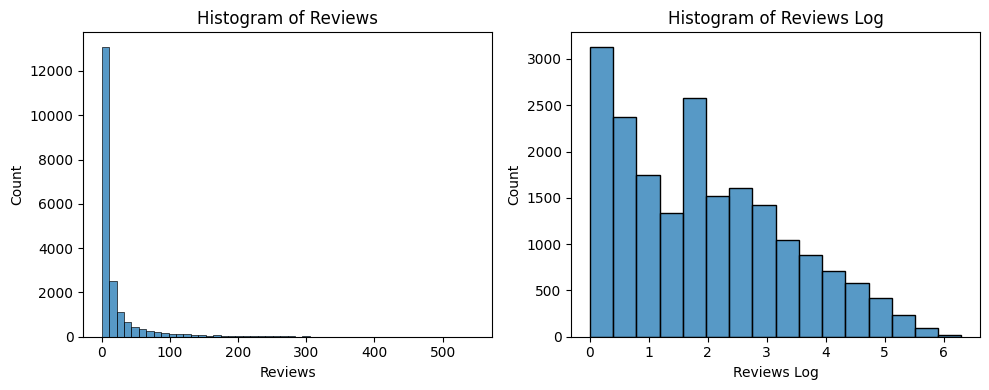

In [53]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Plotting the first and second histogram
sns.histplot(apartments['Reviews'], bins=50, ax=axes[0])
axes[0].set_title('Histogram of Reviews')
sns.histplot(apartments['Reviews Log'], bins=16, ax=axes[1])
axes[1].set_title('Histogram of Reviews Log')

plt.tight_layout()
plt.show()

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Plotting the first and second histogram
sns.histplot(apartments['Price'], bins=50, ax=axes[0])
axes[0].set_title('Histogram of Price')
sns.histplot(apartments['Price Log'], bins=30, ax=axes[1])
axes[1].set_title('Histogram of Price Log')

plt.tight_layout()

plt.show()

# Correlations

In [ ]:
numeric_cols = apartments.select_dtypes(include='number').columns

corr_matrix = apartments[numeric_cols].corr()
plt.figure(figsize=(16, 12))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Location Rating on the Map

In [ ]:
!pip install -q folium matplotlib
import folium
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, Normalize, to_hex

df = apartments[['Latitude', 'Longitude','Location Rating Roughly','Reviews Log']]
df.dropna(inplace=True)

color_map = {
    8: 'blue',
    9: 'green',
    10: 'red'
}

# Создание карты с использованием folium
m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=10)

# Добавление точек на карту
for idx, row in df.iterrows():
    color = color_map.get(row['Location Rating Roughly'], 'gray')  # Использование серого цвета по умолчанию
    folium.CircleMarker(
        location=(row['Latitude'], row['Longitude']),
        radius = 2, #row['Reviews Log'] + 1,
        color=color,
        fill=True,
        fill_color=color
    ).add_to(m)

# Создание пользовательской цветовой легенды
legend_html = '''
<div style="
    position: fixed;
    bottom: 50px; left: 50px; width: 150px; height: 100px;
    background-color: white; z-index:9999; font-size:14px;
    border:2px solid grey; border-radius:5px;
    ">
    <div style="padding: 10px;">
        <b>Location Rating</b><br>
        <i style="background:blue; width:18px; height:18px; float:left; margin-right:5px; border-radius:50%;"></i>8<br>
        <i style="background:green; width:18px; height:18px; float:left; margin-right:5px; border-radius:50%;"></i>9<br>
        <i style="background:red; width:18px; height:18px; float:left; margin-right:5px; border-radius:50%;"></i>10<br>
    </div>
</div>
'''

# Добавление легенды на карту
m.get_root().html.add_child(folium.Element(legend_html))

# Сохранение карты в файл
m.save('map_rating.html')

# Отображение карты (если используется Jupyter Notebook или Colab)
m

## Price on the Map

In [ ]:
import pandas as pd
import folium
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, Normalize, to_hex

df = apartments[['Latitude', 'Longitude','Price','Reviews Log']]
df.dropna(inplace=True)

# Создание цветовой карты от синего через зеленый до красного
colors = ['blue', 'red', 'yellow']
cmap = LinearSegmentedColormap.from_list('RatingColorMap', colors, N=10)

# Нормализация значений Rating для использования в цветовой карте
#norm = Normalize(vmin=df['Price'].min(), vmax=df['Price'].max())
norm = Normalize(vmin=15, vmax=70)

# Создание карты с использованием folium
m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=10)

# Добавление точек на карту
for idx, row in df.iterrows():
    color = to_hex(cmap(norm(row['Price'])))
    folium.CircleMarker(
        location=(row['Latitude'], row['Longitude']),
        radius = 2, #row['Reviews Log'] + 1,
        color=color,
        fill=True,
        fill_color=color
    ).add_to(m)

# Создание пользовательской цветовой легенды
legend_html = '''
<div style="
    position: fixed;
    bottom: 50px; left: 50px; width: 150px; height: 100px;
    background-color: white; z-index:9999; font-size:14px;
    border:2px solid grey; border-radius:5px;
    ">
    <div style="padding: 10px;">
        <b>Price</b><br>
        <i style="background:blue; width:18px; height:18px; float:left; margin-right:5px; border-radius:50%;"></i>15<br>
        <i style="background:linear-gradient(blue, red, yellow); width:18px; height:18px; float:left; margin-right:5px; border-radius:50%;"></i>...<br>
        <i style="background:yellow; width:18px; height:18px; float:left; margin-right:5px; border-radius:50%;"></i>70<br>
    </div>
</div>
'''

# Добавление легенды на карту
m.get_root().html.add_child(folium.Element(legend_html))

# Сохранение карты в файл
m.save('map_price.html')

# Отображение карты (если используется Jupyter Notebook или Colab)
m

# Spatial Autocorrelation of Location Rating and Price


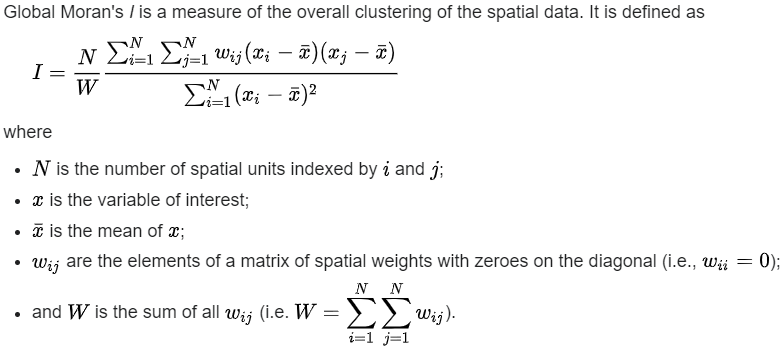

**Calculation of spatial indicators.**

A rough calculation on the plain requires N^2 operations.
Therefore, to reduce the computational complexity, we will divide the city into a grid.

##Dividing the city into a grid

In [60]:
!pip install geopy -q
from geopy.distance import geodesic

coords_e = (apartments['Latitude'].max() , apartments['Longitude'].min())
coords_w = (apartments['Latitude'].max() , apartments['Longitude'].max())
distance_meters = geodesic(coords_e, coords_w).kilometers

distance_str = "{:,.2f}".format(distance_meters).replace(",", " ")
print(f"Distance from East to West  : {distance_str} km")

coords_s = (apartments['Latitude'].min() , apartments['Longitude'].max())
coords_n = (apartments['Latitude'].max() , apartments['Longitude'].max())
distance_meters = geodesic(coords_s, coords_n).kilometers

distance_str = "{:,.2f}".format(distance_meters).replace(",", " ")
print(f"Distance from North to South : {distance_str} km")


Distance from East to West  : 44.70 km
Distance from North to South : 33.99 km


**We divide the city into squares of 250x250 meters**


For small distances, the angular grid (Latitude-Longitude) can be considered as rectangular (if we are far from the poles)

In [61]:
# devide Latitude and Longitude
lat_bin = np.linspace(apartments['Latitude'].min(), apartments['Latitude'].max(), 180)  #179 bins 180 points
lon_bin = np.linspace(apartments['Longitude'].min(), apartments['Longitude'].max(), 137)  # 136 bins 137 points

# make Latitude_No and Longitude_No
apartments['Latitude_Bin'] = pd.cut(apartments['Latitude'], bins=lat_bin, labels=False, include_lowest=True)
apartments['Longitude_Bin'] = pd.cut(apartments['Longitude'], bins=lon_bin, labels=False, include_lowest=True)

def determine_bins(lat, lon, lat_bin, lon_bin):
    lat_bin = np.digitize(lat, lat_bin) - 1
    lon_bin = np.digitize(lon, lon_bin) - 1
    return lat_bin, lon_bin

In [ ]:
apartments[['Latitude_Bin', 'Longitude_Bin']].drop_duplicates().shape[0]

2709

In [ ]:
unique_counts = apartments[['Latitude_Bin', 'Longitude_Bin']].value_counts().reset_index()

unique_counts.columns = ['Latitude_Bin', 'Longitude_Bin', 'Count_in_bin']

sns.lineplot(data=unique_counts, x=unique_counts.index, y='Count_in_bin')
plt.show()


In [ ]:
# # удалить записи  если в ['Latitude_Bin', 'Longitude_Bin'] менее 4-х записей

# # Calculate the number of listings in each bin
# bin_counts = apartments.groupby(['Latitude_Bin', 'Longitude_Bin']).size().reset_index(name='count')

# # Filter out bins with less than 4 listings
# bins_to_keep = bin_counts[bin_counts['count'] >= 4][['Latitude_Bin', 'Longitude_Bin']]

# # Merge with the original DataFrame to keep only listings in the selected bins
# apartments1 = apartments.merge(bins_to_keep, on=['Latitude_Bin', 'Longitude_Bin'], how='inner')


# Rating and Price autocorrelation

In [62]:
!pip install pandas numpy libpysal geopy esda -q
from geopy.distance import great_circle
import libpysal
from esda.moran import Moran

def create_inverse_distance_weight_matrix(df, weight_col ='Reviews Log', threshold_km = 0.2, epsilon = 0.03, bin_range = 1):
    # epsilon = 0.03
    # bin_range = 1
    # threshold_km = 0.2

    weights_dict = {i: {} for i in range(len(df))}

    for i in range(len(df)):
        lat_i, lon_i = df.loc[i, 'Latitude'], df.loc[i, 'Longitude']
        lat_bin_i, lon_bin_i = df.loc[i, 'Latitude_Bin'], df.loc[i, 'Longitude_Bin']

        nearby_bins = df[(df['Latitude_Bin'] >= lat_bin_i - bin_range) & (df['Latitude_Bin'] <= lat_bin_i + bin_range) &
                        (df['Longitude_Bin'] >= lon_bin_i - bin_range) & (df['Longitude_Bin'] <= lon_bin_i + bin_range)]

        has_neighbors = False
        for j in range(len(nearby_bins)):
            if nearby_bins.index[j] != i:
                lat_j, lon_j = nearby_bins.iloc[j]['Latitude'], nearby_bins.iloc[j]['Longitude']
                dist_km = great_circle((lat_i, lon_i), (lat_j, lon_j)).kilometers
                if dist_km <= threshold_km:
                    weight = 1 / (dist_km + epsilon) * df.loc[i, weight_col] * nearby_bins.iloc[j][weight_col]
                    weights_dict[i][nearby_bins.index[j]] = weight
                    has_neighbors = True

        # Если у точки нет соседей, добавляем саму точку как собственного соседа с весом 0
        if not has_neighbors:
            weights_dict[i][i] = 0

    # transform to format for libpysal
    w = libpysal.weights.W(weights_dict)
    return w

df_r = apartments[['Latitude', 'Longitude', 'Latitude_Bin', 'Longitude_Bin','Location Rating Roughly','Reviews Log']]
df_r.dropna(inplace=True)
df_r = df_r.reset_index(drop=True)
w = create_inverse_distance_weight_matrix(df_r)

# Moran's I
moran = Moran(df_r['Location Rating Roughly'].values, w)
print(f"Local Rating Moran's I: {moran.I}")
print(f"p-value: {moran.p_sim}")

df_p = apartments[['Latitude', 'Longitude', 'Latitude_Bin', 'Longitude_Bin','Price','Reviews Log']]
df_p.dropna(inplace=True)
df_p = df_p.reset_index(drop=True)
w = create_inverse_distance_weight_matrix(df_p)

# Moran's I
moran = Moran(df_p['Price'].values, w)
print(f"Local Rating Moran's I: {moran.I}")
print(f"p-value: {moran.p_sim}")

Local Rating Moran's I: 0.2084604596414465
p-value: 0.001


ValueError: dimension mismatch

# Calculating the average Rating of neighbors

In [ ]:
df = apartments[['Latitude', 'Longitude', 'Latitude_Bin', 'Longitude_Bin','Location Rating Roughly','Reviews Log']]
df.dropna(inplace=True)
print(df.shape)
df = df.reset_index(drop=True)

def weighted_location_rating(lat, lon, lat_bin, lon_bin, df, primary_threshold_m=250,
                             primary_bin_range = 1,  secondary_threshold_m=500, secondary_bin_range = 2):

    epsilon = 0.03  # Маленькое значение для предотвращения деления на ноль
    #  lat_bin, lon_bin = determine_bins(lat, lon, lat_bin, lon_bin)
    lat_bin = np.digitize(lat, lat_bin) - 1  # Индексы в numpy начинаются с 0
    lon_bin = np.digitize(lon, lon_bin) - 1

    def calculate_weighted_average(threshold_km, bin_range):
        weighted_sum = 0
        total_weight = 0

        # Отбираем точки из заданных и соседних бинов
        nearby_bins = df[(df['Latitude_Bin'] >= lat_bin - bin_range) & (df['Latitude_Bin'] <= lat_bin + bin_range) &
                         (df['Longitude_Bin'] >= lon_bin - bin_range) & (df['Longitude_Bin'] <= lon_bin + bin_range)]

        for i in range(len(nearby_bins)):
            lat_i, lon_i = nearby_bins.iloc[i]['Latitude'], nearby_bins.iloc[i]['Longitude']
            dist_km = great_circle((lat, lon), (lat_i, lon_i)).kilometers
            if dist_km <= threshold_km:
                weight = 1 / (dist_km + epsilon) * nearby_bins.iloc[i]['Reviews Log']
                weighted_sum += nearby_bins.iloc[i]['Location Rating Roughly'] * weight
                total_weight += weight

        return weighted_sum, total_weight

    # Первоначальный расчет для соседних бинов (±1) и порога 500 метров
    threshold_km = primary_threshold_m / 1000
    weighted_sum, total_weight = calculate_weighted_average(threshold_km, bin_range = primary_bin_range)

    # Если нет точек в соседних бинах, увеличиваем диапазон до ±2 и порог до 1000 метров
    if total_weight == 0:
        threshold_km = secondary_threshold_m / 1000
        weighted_sum, total_weight = calculate_weighted_average(threshold_km, secondary_bin_range)  # для 500 бин 1

    if total_weight == 0:
        return 8.5 # Если нет соседей, возвращаем 8 1/2, а не np.nan
    weighted_avg = weighted_sum / total_weight
    return weighted_avg

# Пример использования функции
lat = 52.489182
lon = 13.416555
weighted_rating = weighted_location_rating(lat, lon, lat_bin, lon_bin, df,
            primary_threshold_m=150, primary_bin_range = 1,  secondary_threshold_m=500, secondary_bin_range = 2)
print(f"Weighted Location Rating: {weighted_rating}")

(16206, 6)
Weighted Location Rating: 9.689636092416515


In [ ]:
### df['result'] = df.apply(lambda row: func(row['latitude'], row['longitude']), axis=1)

In [ ]:
# Пример данных
data = {
    'latitude': [40.7128, 34.0522, 51.5074],
    'longitude': [-74.0060, -118.2437, -0.1278]
}
df = pd.DataFrame(data)

# Пример функции, принимающей DataFrame, широту и долготу
def func(df1, lat, lon):
    # Пример функции: расчет среднего значения широты и долготы в df1
    mean_lat = df1['latitude'].mean()
    mean_lon = df1['longitude'].mean()
    return (mean_lat - lat)**2 + (mean_lon - lon)**2

# Создание нового столбца result
results = []
for index, row in df.iterrows():
    df1 = df.drop(index)
    result = func(df1, row['latitude'], row['longitude'])
    results.append(result)

df['result'] = results

print(df)


# dataFrame for linear regression

In [ ]:
apartments.columns

Index(['Listing ID', 'Listing URL', 'Listing Name', 'Host ID', 'Host URL',
       'Host Name', 'Host Since', 'Host Response Time', 'Host Response Rate',
       'Is Superhost', 'neighbourhood', 'Neighborhood Group', 'City',
       'Postal Code', 'Country Code', 'Country', 'Latitude', 'Longitude',
       'Is Exact Location', 'Property Type', 'Room Type', 'Accomodates',
       'Bathrooms', 'Bedrooms', 'Beds', 'Square Feet', 'Price',
       'Guests Included', 'Min Nights', 'Reviews', 'First Review',
       'Last Review', 'Overall Rating', 'Accuracy Rating',
       'Cleanliness Rating', 'Checkin Rating', 'Communication Rating',
       'Location Rating', 'Value Rating', 'Instant Bookable',
       'Business Travel Ready', 'Host Since Years', 'Last Review Years',
       'First Review Years', 'Reviews Log', 'Location Rating Roughly',
       'Price Log', 'Latitude_Bin', 'Longitude_Bin'],
      dtype='object')

In [ ]:
df = apartments[['Listing ID','Is Superhost','Latitude', 'Longitude', 'Accomodates',
                 'Bathrooms', 'Bedrooms', 'Beds', 'Price', 'Guests Included',
                 'Min Nights', 'Reviews', 'Overall Rating',
                 'Instant Bookable','Host Since Years', 'Last Review Years',
                 'First Review Years', 'Reviews Log', 'Location Rating Roughly',
                 'Price Log', 'Latitude_Bin', 'Longitude_Bin']]

In [ ]:
df.shape

(19786, 22)

In [ ]:
df.dropna(inplace=True)
df.shape

(16159, 22)

предобработка - расчет рейтинга места

In [ ]:
df.drop('Listing ID', axis=1, inplace=True)

# Разделяем данные на признаки и целевую переменную
y = df['Overall Rating']
X = df.drop('Overall Rating', axis=1)

# Разделяем данные на тренировочную и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
#X_trainT = X_train.sample(1000)
X_train['Average Location Rating'] = X_train.apply(lambda row:
        weighted_location_rating(row['Latitude'], row['Longitude'], lat_bin, lon_bin, X_train), axis=1)

In [ ]:
X_test['Average Location Rating'] = X_test.apply(lambda row:
        weighted_location_rating(row['Latitude'], row['Longitude'], lat_bin, lon_bin, X_train), axis=1)

In [ ]:
X_train.columns

Index(['Is Superhost', 'Latitude', 'Longitude', 'Accomodates', 'Bathrooms',
       'Bedrooms', 'Beds', 'Price', 'Guests Included', 'Min Nights', 'Reviews',
       'Instant Bookable', 'Host Since Years', 'Last Review Years',
       'First Review Years', 'Reviews Log', 'Location Rating Roughly',
       'Price Log', 'Latitude_Bin', 'Longitude_Bin',
       'Average Location Rating'],
      dtype='object')

In [ ]:
X_train.drop(['Latitude', 'Longitude', 'Reviews', 'Latitude_Bin', 'Longitude_Bin','Location Rating Roughly'], axis=1, inplace=True)
X_test.drop(['Latitude', 'Longitude', 'Reviews', 'Latitude_Bin', 'Longitude_Bin','Location Rating Roughly'], axis=1, inplace=True)

In [ ]:
# import pandas as pd
# from sklearn.model_selection import train_test_split
# from sklearn.linear_model import Lasso
# from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
# import numpy as np



# # Нормализуем фичи
# scaler = StandardScaler()
# X_scaled = scaler.fit_transform(X)

# # Восстанавливаем названия столбцов
# X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)


# Создаем линейную модель с L1-регуляризацией (Lasso)
#lasso = Lasso(alpha=0.1)  # alpha - параметр регуляризации

# Обучаем модель на тренировочной выборке
#lasso.fit(X_train, y_train)
reg = LinearRegression().fit(X_train, y_train)

# Делаем предсказания на тестовой и тренировочной выборках
y_test_pred = reg.predict(X_test)
y_train_pred = reg.predict(X_train)

# Считаем MAE, MSE, RMSE и R² для тестовой выборки
test_mae = mean_absolute_error(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_r2 = r2_score(y_test, y_test_pred)

print(f'Test Mean Absolute Error: {test_mae}')
print(f'Test Mean Squared Error: {test_mse}')
print(f'Test Root Mean Squared Error: {test_rmse}')
print(f'Test R² Score: {test_r2}')

# Считаем MAE, MSE, RMSE и R² для тренировочной выборки
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_r2 = r2_score(y_train, y_train_pred)

print(f'Train Mean Absolute Error: {train_mae}')
print(f'Train Mean Squared Error: {train_mse}')
print(f'Train Root Mean Squared Error: {train_rmse}')
print(f'Train R² Score: {train_r2}')

# Выводим коэффициенты модели с названиями фичей
#coef_df = pd.DataFrame(reg.coef_, index=X.columns, columns=['Coefficient'])
#print('Model Coefficients:')
#print(coef_df)

Test Mean Absolute Error: 4.871530053112203
Test Mean Squared Error: 54.57433244618059
Test Root Mean Squared Error: 7.387444243185906
Test R² Score: 0.03850116836352235
Train Mean Absolute Error: 4.631337870516803
Train Mean Squared Error: 50.062602450181785
Train Root Mean Squared Error: 7.075493088837115
Train R² Score: 0.08259703278160824


In [ ]:
# prompt: коэффициенты модели reg с названнием фичей

# Выводим коэффициенты модели с названиями фичей
coef_df = pd.DataFrame(reg.coef_, index=X_train.columns, columns=['Coefficient'])
print('Model Coefficients:')
print(coef_df)


Model Coefficients:
                         Coefficient
Is Superhost                3.004557
Accomodates                -0.340674
Bathrooms                   0.063762
Bedrooms                    0.688032
Beds                       -0.442981
Price                       0.007505
Guests Included            -0.060323
Min Nights                  0.198533
Instant Bookable           -1.139715
Host Since Years            0.174061
Last Review Years          -0.587364
First Review Years         -0.402345
Reviews Log                -0.279556
Price Log                  -0.051686
Average Location Rating     2.983124


In [ ]:
y_test_pred.mean()

94.66590720505204

In [ ]:
y_test.mean()

94.60674504950495

In [ ]:
y_train_pred.mean()

94.66132900131508

In [ ]:
y_train.mean()

94.66132900131508